In [1]:
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import matplotlib.pyplot as plt
import umap.umap_ as umap
from sklearn.datasets import make_blobs
import numpy as np
%matplotlib inline
import scipy
import time
import networkx as nx
import collections
from collections import defaultdict
import random
import pandas as pd
import statistics

from models_updated import *
import networkx as nx

import random

sns.set(style='white', context='poster', rc={'figure.figsize':(8,6)})
#default_seed = 16


/home/u58373/.local/lib/python3.7/site-packages/numba/core/cpu.py:78: UserWarning: Numba extension module 'sdc' failed to load due to 'VersionConflict((numba 0.52.0 (/home/u58373/.local/lib/python3.7/site-packages), Requirement.parse('numba<0.52,>=0.51.2')))'.
  numba.core.entrypoints.init_all()


In [2]:
def ipfnA(data, n_neighbors):
    #s= no of points
    #c_arr = Array of centers
    #sd = std. dev.
    #n = n_neighbors 
#     print([s,c_arr, sd, n_neighbors])

    
    r = np.random.RandomState(10)
    coo_matrix1 = umap.fuzzy_simplicial_set(data,n_neighbors,r,'euclidean')
    coo_matrix1 = np.asarray(coo_matrix1)
    sparse_matrix = coo_matrix1[0]
    #print(sparse_matrix.getnnz()

    return nx.from_scipy_sparse_matrix(sparse_matrix)
    

In [3]:
import pickle
with open('Cluster Experiments/cluster1.pkl', 'rb') as infile:
    data1 = pickle.load(infile)
    
with open('Cluster Experiments/cluster2.pkl', 'rb') as infile:
    data2 = pickle.load(infile)



Clusters:
    Cluster 1: Centre (1,1)
        Cluster 2: Centre (1,21)
            Standard Deviation for both is #3

In [4]:
def ipfnB(G1,s):
#s = no of points
    SIGMA  = 1/5.2
    GAMMA  = 1/10
    MU_I   = 0.002

    R0     = 2.5
    BETA   = 1/(1/GAMMA) * R0
    BETA_Q = 0.5*BETA

    P      = 0.2
    Q      = 0.05
    
    model_base = SEIRSNetworkModel(G       = G1, 
                          beta    = BETA, 
                          sigma   = SIGMA, 
                          gamma   = GAMMA, 
                          initE = s*0.30, initI = s*0.1)
    
    model_base.run(T=300)
    fig,axs = model_base.figure_basic(ylim=0.75,xlim=100)
    
    line = axs.lines[1]
    p = line.get_data()
    p0 = p[0].compressed()
    p1 = p[1].compressed()
    #Maximum
    m = max(p[1])
    #Days Max
    ind= numpy.argmax(p[1])
    d = p[0][numpy.argmax(p[1])]
    #Mean and St Deviation
    mean  = statistics.mean(p1)
    stdev =  statistics.stdev(p1)
    line1 = axs.lines[2]
    w = line1.get_data()
    #Total Infections
    tot = 1 -(w[1][w[1].shape[0]-1])
    tp = 0.1*m
    np = 0.9*m
    #Ten Percent
    tpl =[]
    for i in range(len(p1)):
        x = numpy.abs(p1[i]-tp)
        if(x<0.001):
            #print(p1[i],x,p0[i])
            tpl.append(p0[i])
    tplval = statistics.mean(tpl)
    
    #Ninety Percent
    nplfh =[]
    nplsh = []
    for i in range(ind):
        x = numpy.abs(p1[i]-np)
        if(x<0.001):
            #print(p1[i],x,p0[i])
            nplfh.append(p0[i])
    for i in range(ind, len(p1)):
        x = numpy.abs(p1[i]-np)
        if(x<0.001):
            #print(p1[i],x,p0[i])
            nplsh.append(p0[i])
    npl=[(statistics.mean(nplfh)),(statistics.mean(nplsh))]
    
    P = model_base.X
    cluster2 = P[1000:]
    count =0
    for i in cluster2:
        if(i==4):
            count = count+1
            
    lday = p0[(len(p0)-1)]
    
    
    return m,d,tot,tplval,npl, mean, stdev,count,lday

In [33]:
def ipfnLine(G1,s):
    #s = no of points
    SIGMA  = 1/5.2
    GAMMA  = 1/10
    MU_I   = 0.002

    R0     = 2.5
    BETA   = 1/(1/GAMMA) * R0
    BETA_Q = 0.5*BETA

    P      = 0.2
    Q      = 0.05
    
    model_base = SEIRSNetworkModel(G       = G1, 
                          beta    = BETA, 
                          sigma   = SIGMA, 
                          gamma   = GAMMA, 
                          initE = s*0.30, initI = s*0.1)
    
    model_base.run(T=300)
    fig,axs = model_base.figure_basic(ylim=0.75,xlim=100)
    
    line = axs.lines[1]
    p = line.get_data()
    p0 = p[0].compressed()
    p1 = p[1].compressed()
    
    return line

In [9]:
graph1 = ipfnA(data1,20)

/opt/intel/inteloneapi/intelpython/latest/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


In [10]:
graph2 = ipfnA(data2,20)

In [8]:
d3 =[]
for i in data1:
    d3.append(i)
for k in data2:
    d3.append(k)
d3 = np.asarray(d3)

In [4]:
import pickle
data = d3
with open('Cluster Experiments/Full_data_loc.pkl', 'wb') as outfile:
    pickle.dump(data, outfile, pickle.HIGHEST_PROTOCOL)

NameError: name 'd3' is not defined

In [11]:
graph_base = nx.disjoint_union(graph1,graph2)

In [12]:
graph_list =[]

In [13]:
graph_list.append(graph_base)

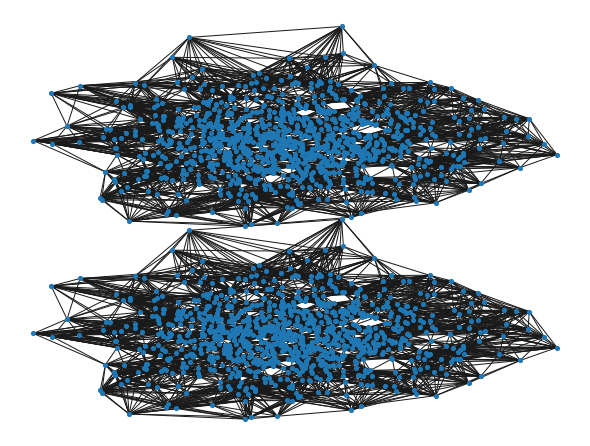

In [24]:
nx.draw(graph_list[0],pos=d3,node_size =10)

In [14]:
def add_edges(n):
    edges = n
    edge_list=[]
    for i in range(edges):
        x= random.randint(0,999)
        y= random.randint(1000,1999)
        edge_list.append((x,y))

    graph_temp = nx.disjoint_union(graph1,graph2)
    graph_temp.add_edges_from(edge_list)

    graph_list.append(graph_temp)

In [15]:
nedges =[]
for x in range(1,11):
    nedges.append(100*x)

In [16]:
nedges

[100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]

In [17]:
for n in nedges:
    add_edges(n)

In [18]:
len(graph_list)

11

In [11]:
def removeDuplicates(lst): 
      
    return list(set([i for i in lst]))

In [12]:
edge_list = removeDuplicates(edge_list)

In [13]:
len(edge_list)

10944

In [16]:
graph_temp = nx.disjoint_union(graph1,graph2)
graph_temp.add_edges_from(edge_list)

graph_list.append(graph_temp)


In [59]:
with open('Cluster Experiments/graph_list_0to1k.pkl', 'wb') as outfile:
    pickle.dump(graph_list, outfile, pickle.HIGHEST_PROTOCOL)

In [5]:
with open('Cluster Experiments/graph_list_long.pkl', 'rb') as infile:
    graph_list = pickle.load(infile)

In [6]:
Y=[]
X=[]
T=[]
TP=[]
NPL=[]
AVG=[]
STDV=[]
COUNT =[]
LDAY =[]

t = 0.00
t = 10.00
t = 20.13
t = 30.10
t = 40.18
t = 50.17
t = 60.34


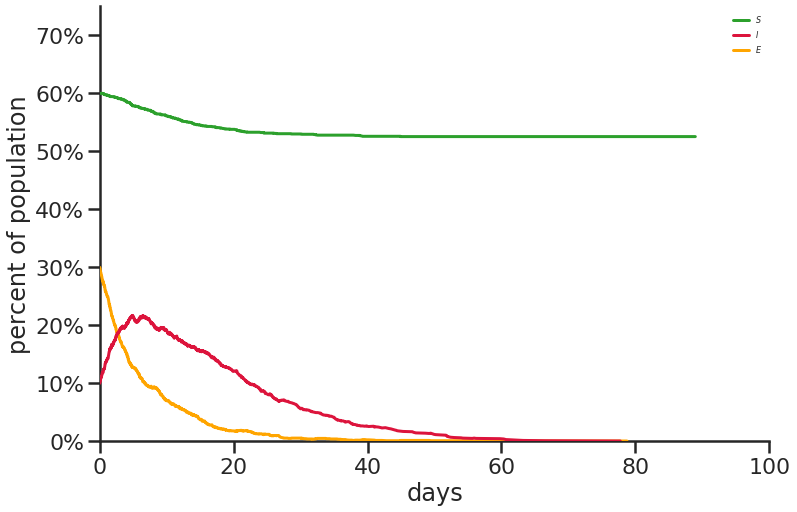

t = 0.00
t = 10.04
t = 20.02
t = 30.03
t = 40.24
t = 50.01
t = 60.49
t = 70.32
t = 80.12
t = 90.26


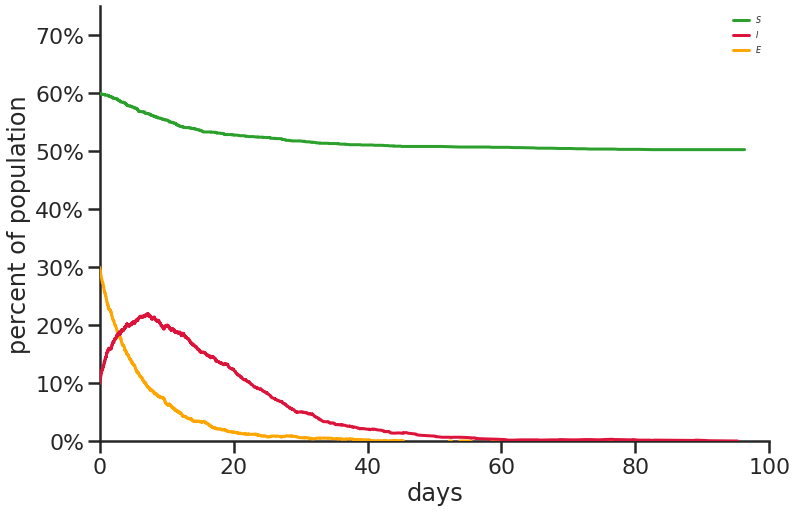

t = 0.00
t = 10.01
t = 20.01
t = 30.00
t = 40.01
t = 50.11
t = 60.06
t = 70.41
t = 80.79
t = 90.30
t = 100.32
t = 120.69


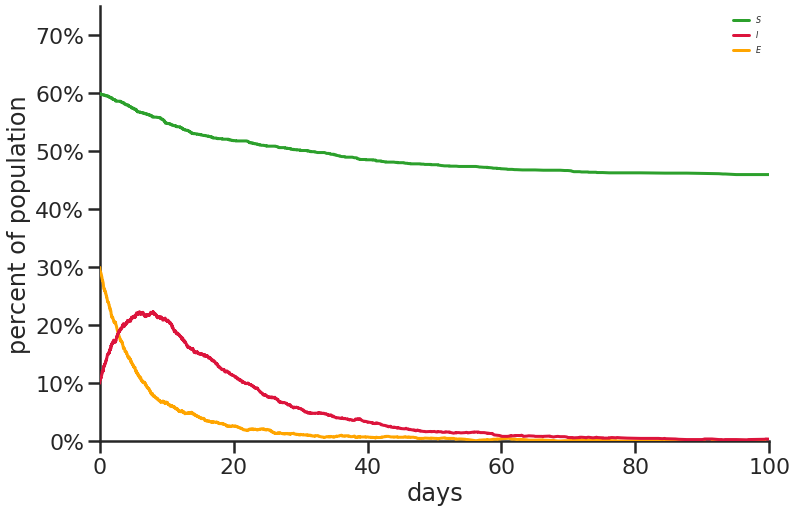

t = 0.00
t = 10.05
t = 20.04
t = 30.05
t = 40.00
t = 50.01
t = 60.03
t = 70.46
t = 80.19
t = 90.81
t = 100.07
t = 110.75
t = 130.99


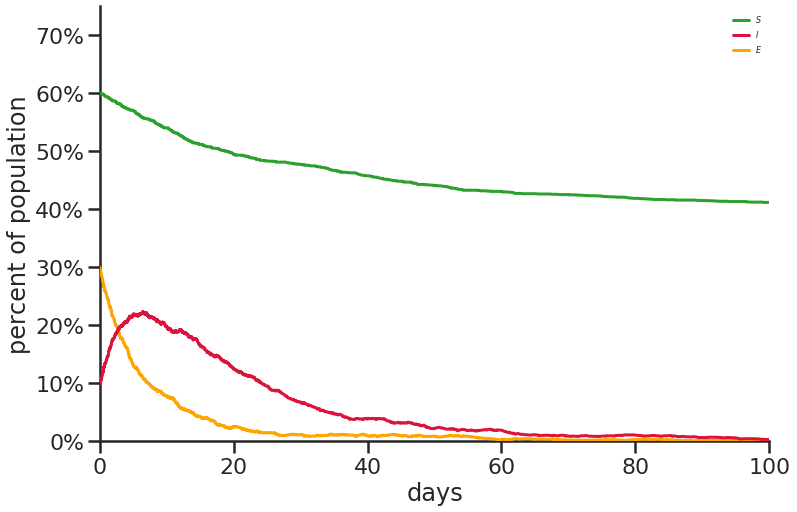

t = 0.00
t = 10.02
t = 20.01
t = 30.16
t = 40.05
t = 50.05
t = 60.37
t = 70.03
t = 80.03
t = 90.40
t = 100.84
t = 110.46
t = 130.31


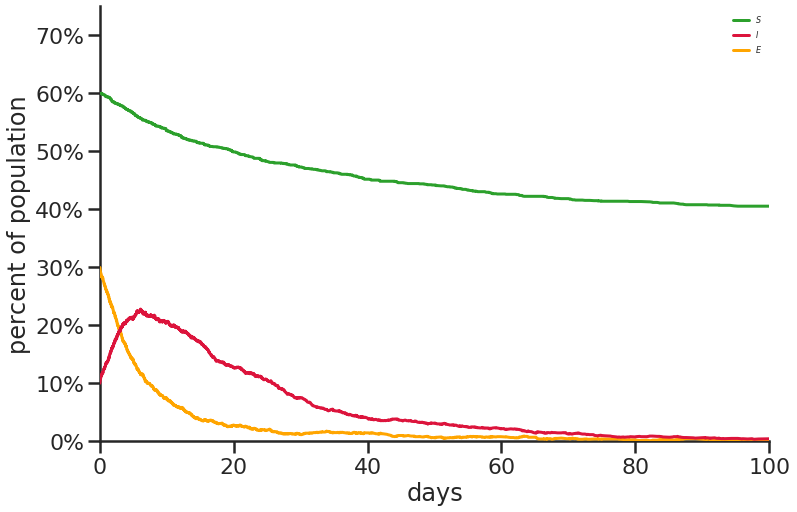

t = 0.01
t = 10.02
t = 20.02
t = 30.03
t = 40.01
t = 50.18
t = 60.07
t = 70.02
t = 80.14
t = 90.45
t = 100.87
t = 110.11
t = 120.11
t = 130.33


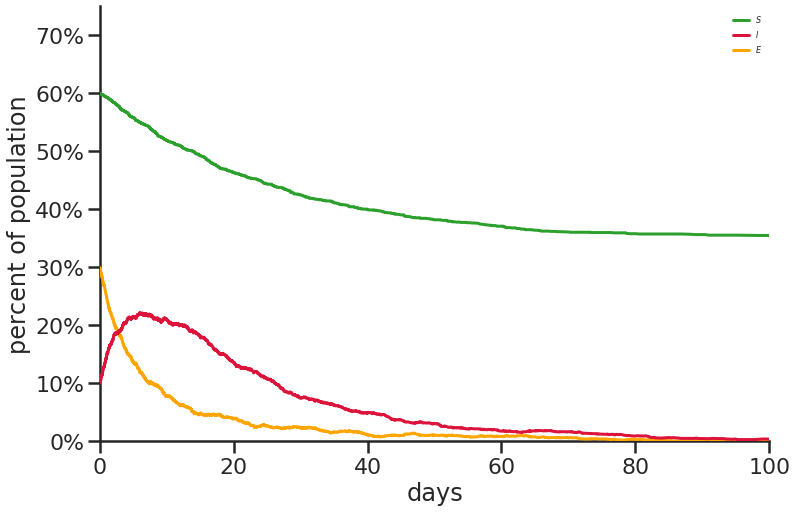

t = 0.01
t = 10.00
t = 20.01
t = 30.01
t = 40.03
t = 50.02
t = 60.29
t = 70.11
t = 80.08
t = 90.30
t = 100.05
t = 110.38
t = 140.18


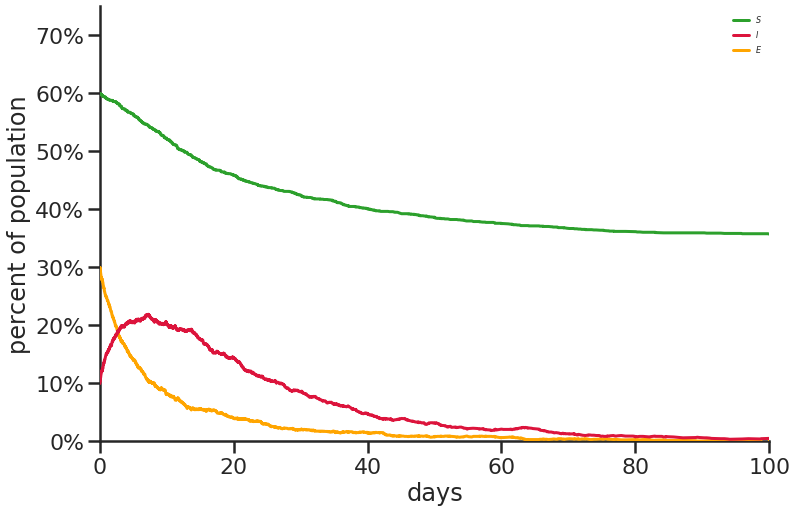

t = 0.01
t = 10.01
t = 20.01
t = 30.04
t = 40.00
t = 50.03
t = 60.29
t = 70.06
t = 80.02
t = 90.57
t = 100.55


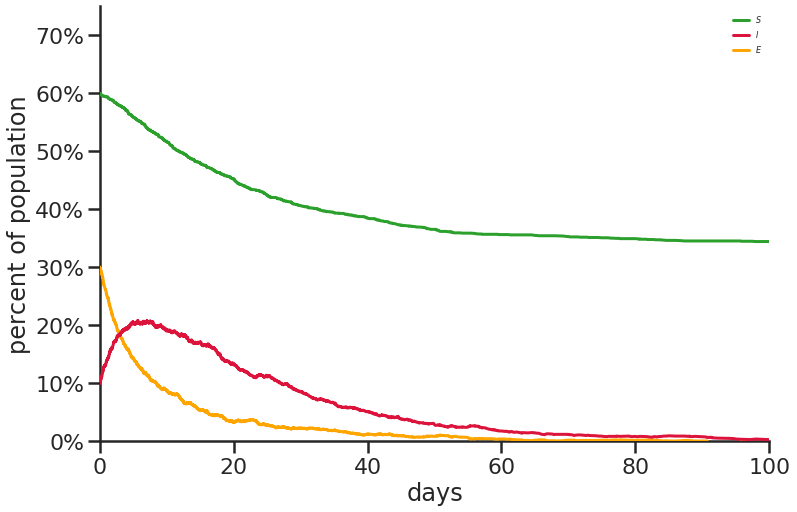

t = 0.01
t = 10.01
t = 20.03
t = 30.01
t = 40.01
t = 50.00
t = 60.11
t = 70.06
t = 80.91
t = 90.24
t = 100.33
t = 110.35
t = 120.56
t = 140.20


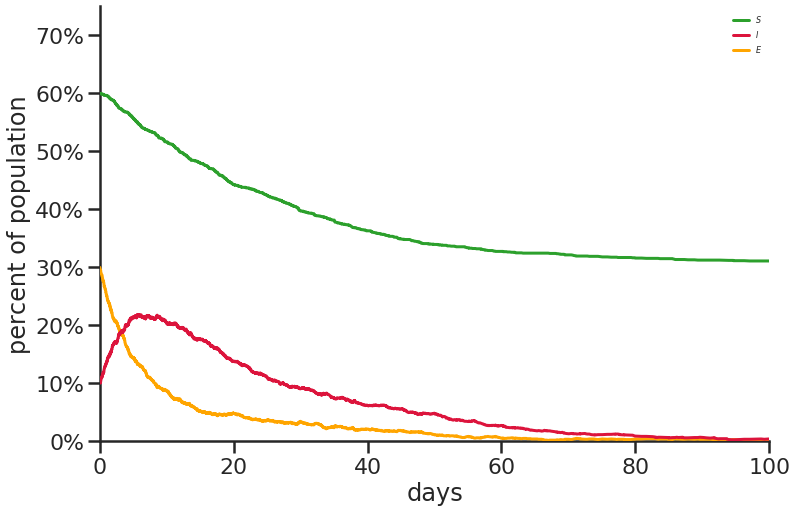

t = 0.02
t = 10.01
t = 20.01
t = 30.01
t = 40.09
t = 50.11
t = 60.33
t = 70.48
t = 80.34
t = 100.17


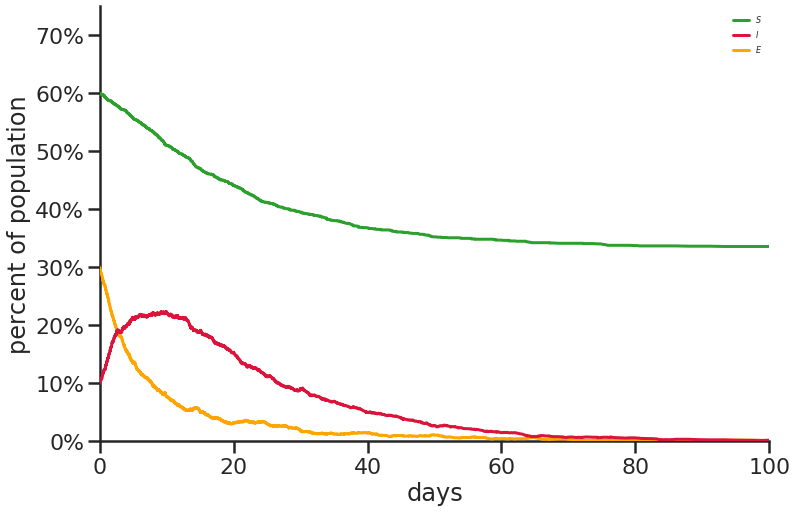

t = 0.01
t = 10.02
t = 20.03
t = 30.01
t = 40.05
t = 50.02
t = 60.12
t = 70.03
t = 80.03
t = 90.00
t = 130.56


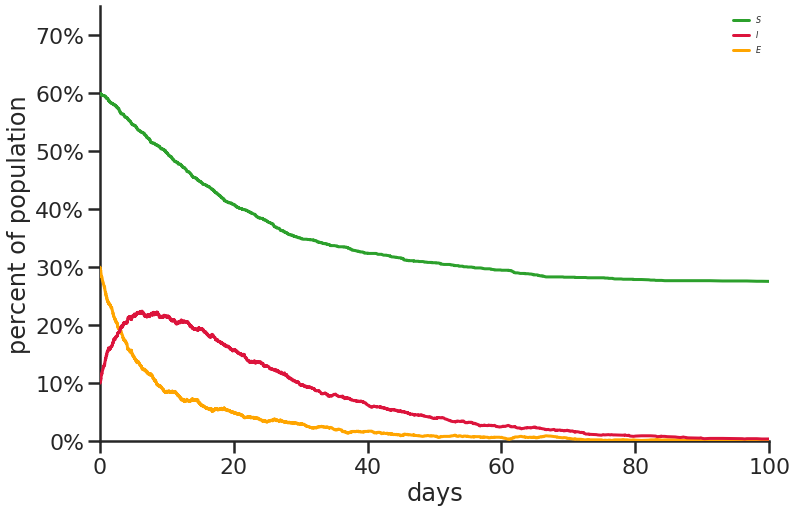

In [28]:
for graph in graph_list:
    y,x,t,tp,npl,avg,stdv,count,lday = ipfnB(graph,2000)
    Y.append(y)
    X.append(x)
    T.append(t)
    TP.append(tp)
    NPL.append(npl)
    AVG.append(avg)
    STDV.append(stdv)
    COUNT.append(count)
    LDAY.append(lday)
    

In [35]:
import plotly.graph_objects as go

t = 0.01
t = 10.01
t = 20.02
t = 30.15
t = 40.00
t = 50.55
t = 60.00
t = 80.16


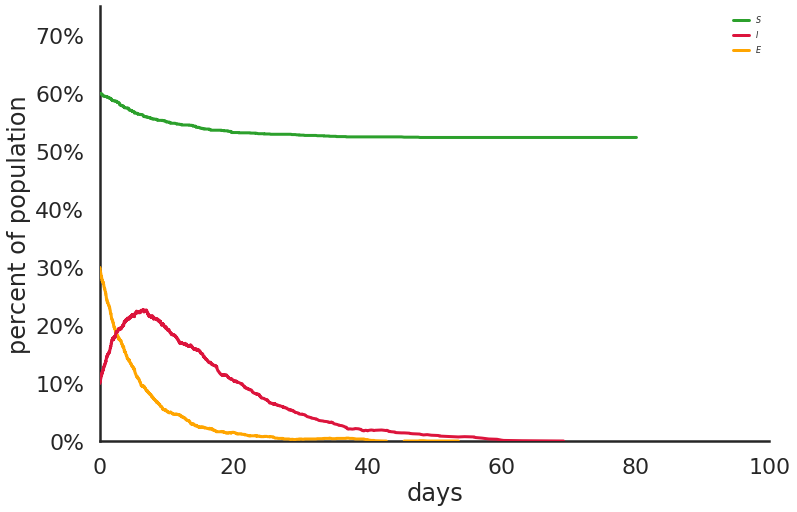

t = 0.00
t = 10.01
t = 20.01
t = 30.04
t = 40.03
t = 50.15
t = 60.01
t = 70.03
t = 90.63
t = 110.55


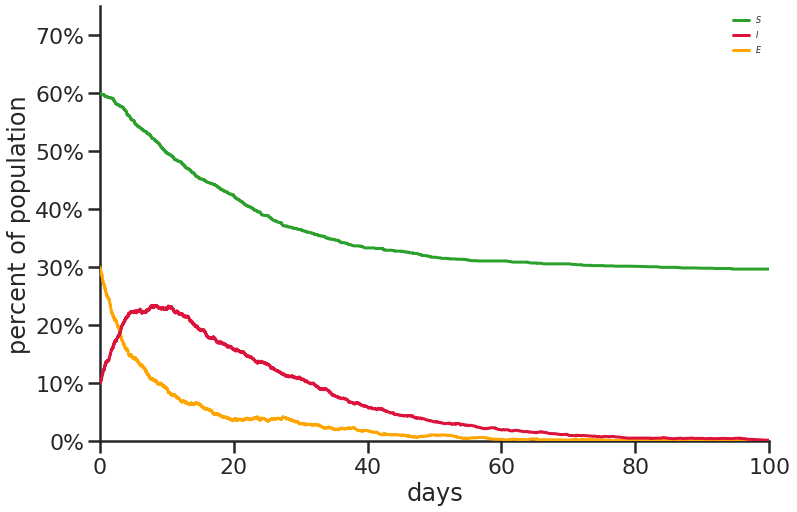

t = 0.00
t = 10.00
t = 20.00
t = 30.01
t = 40.09
t = 50.00
t = 60.11
t = 70.14
t = 80.21
t = 90.22
t = 100.58


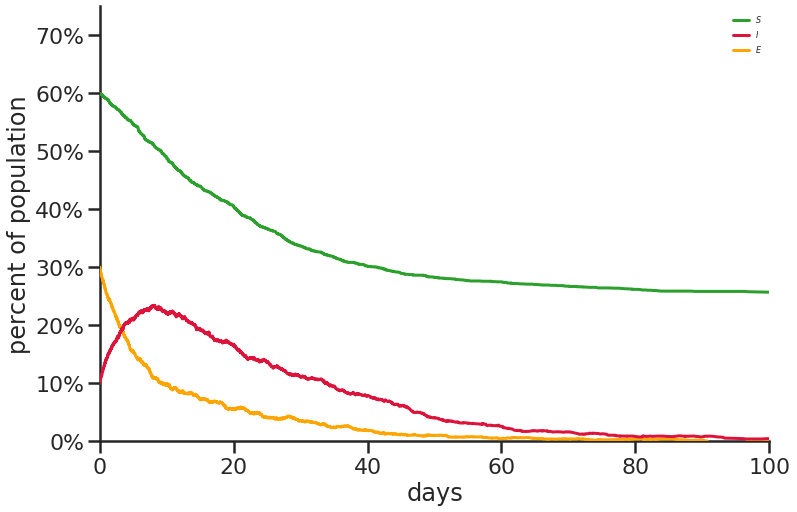

t = 0.00
t = 10.00
t = 20.03
t = 30.03
t = 40.01
t = 50.01
t = 60.21
t = 70.31
t = 80.14
t = 90.53
t = 120.24
t = 140.94


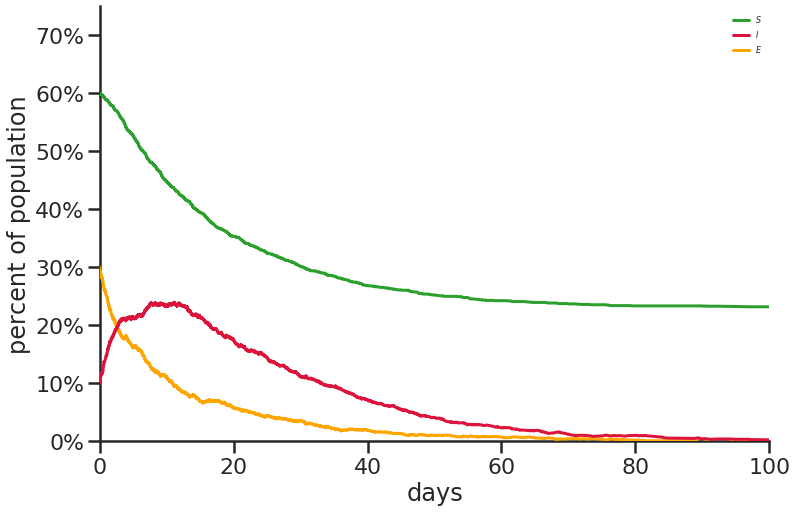

t = 0.00
t = 10.01
t = 20.01
t = 30.00
t = 40.02
t = 50.06
t = 60.02
t = 70.35
t = 80.37


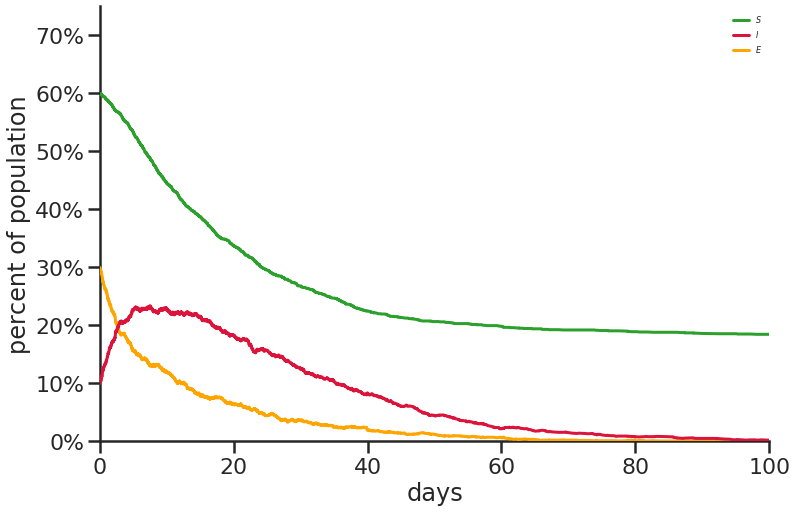

t = 0.00
t = 10.02
t = 20.02
t = 30.00
t = 40.04
t = 50.02
t = 60.04
t = 70.22
t = 80.21
t = 90.65


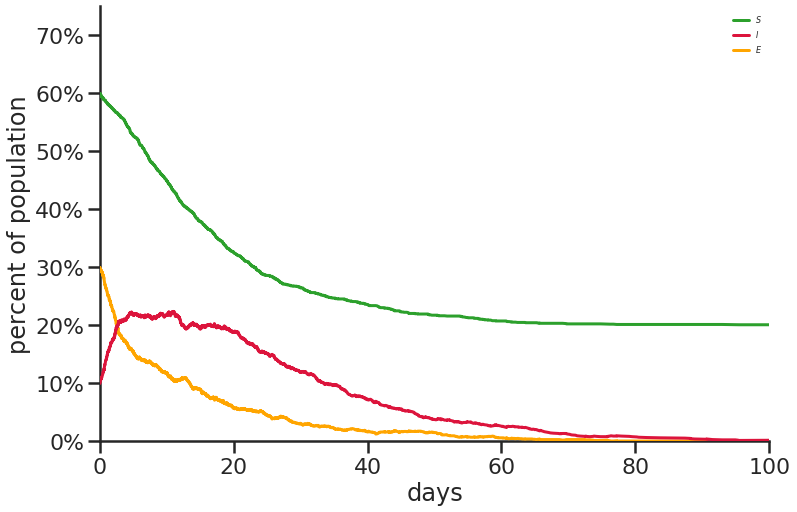

t = 0.00
t = 10.02
t = 20.01
t = 30.01
t = 40.13
t = 50.11
t = 60.01
t = 70.17
t = 80.95
t = 110.61


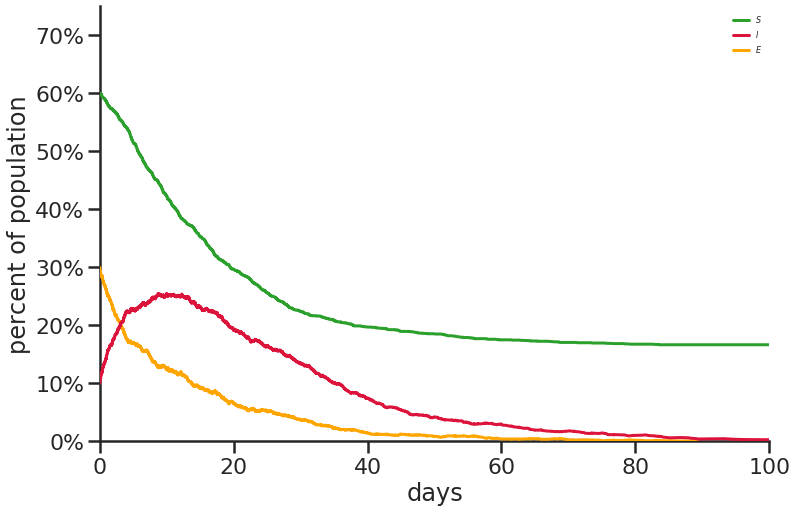

t = 0.02
t = 10.00
t = 20.03
t = 30.00
t = 40.00
t = 50.09
t = 60.05
t = 70.12
t = 100.29


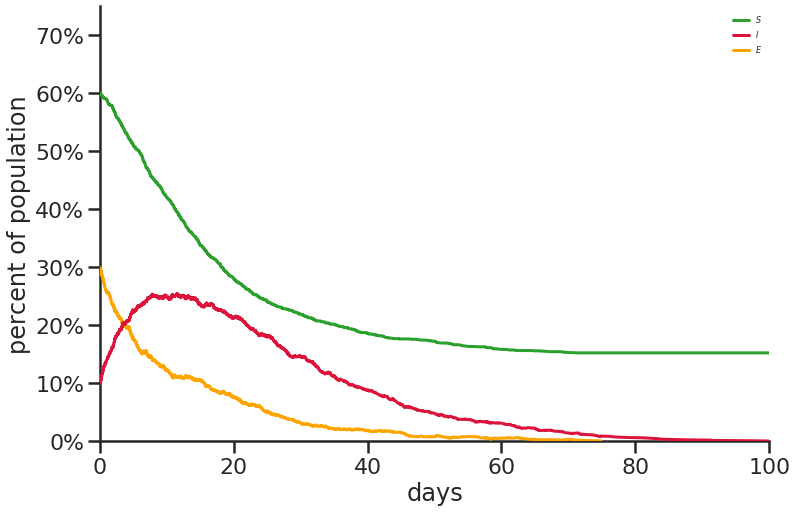

t = 0.00
t = 10.00
t = 20.01
t = 30.00
t = 40.07
t = 50.01
t = 60.28
t = 70.18
t = 80.04
t = 90.33
t = 100.38
t = 110.18


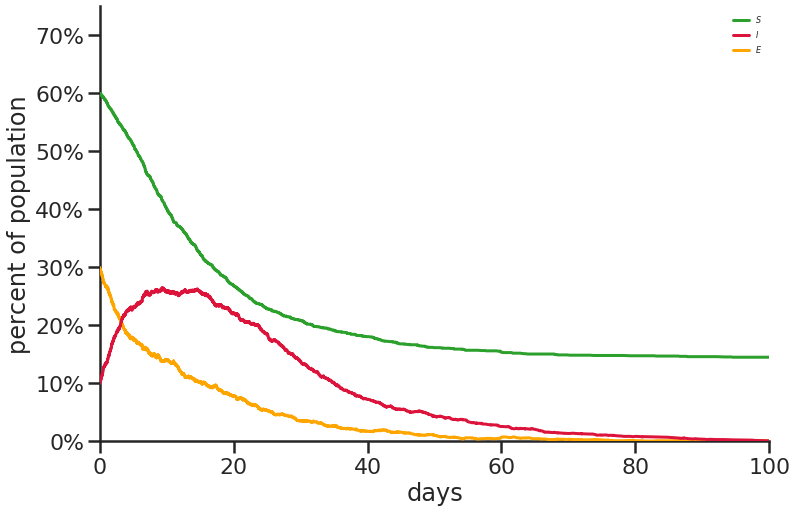

t = 0.00
t = 10.01
t = 20.00
t = 30.05
t = 40.02
t = 50.02
t = 60.78
t = 80.09


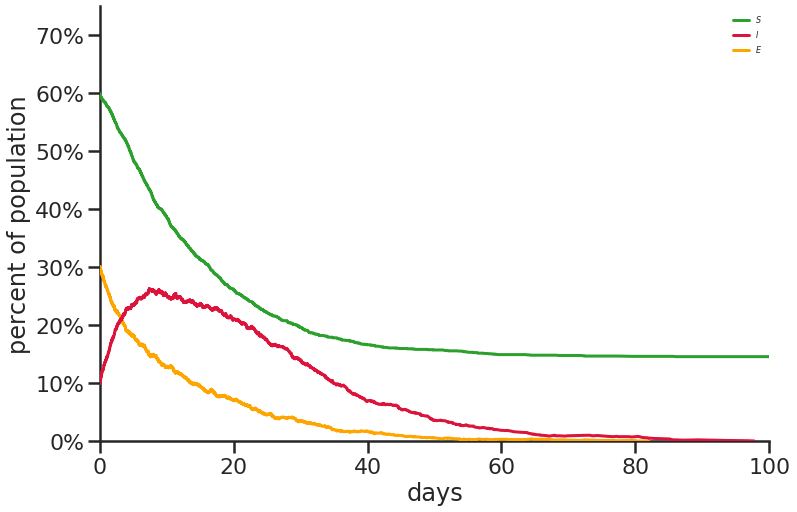

t = 0.00
t = 10.00
t = 20.02
t = 30.01
t = 40.00
t = 50.05
t = 60.60
t = 70.62
t = 80.60


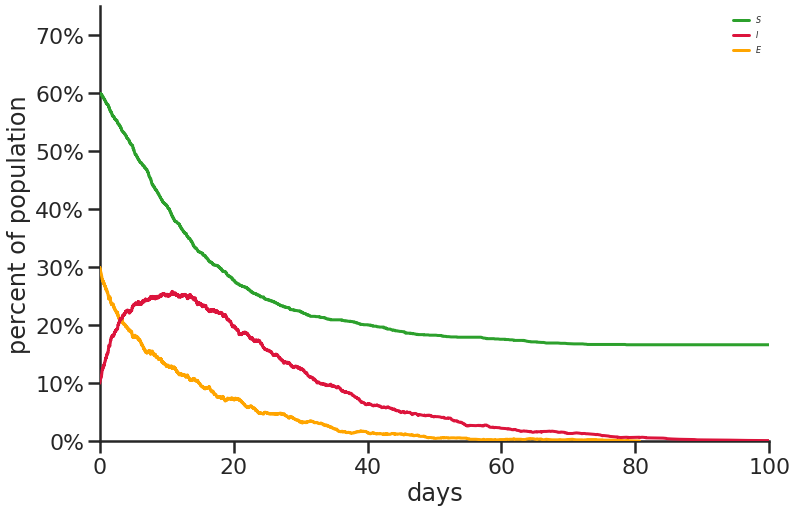

t = 0.00
t = 10.02
t = 20.00
t = 30.01
t = 40.03
t = 50.05
t = 60.56
t = 70.54


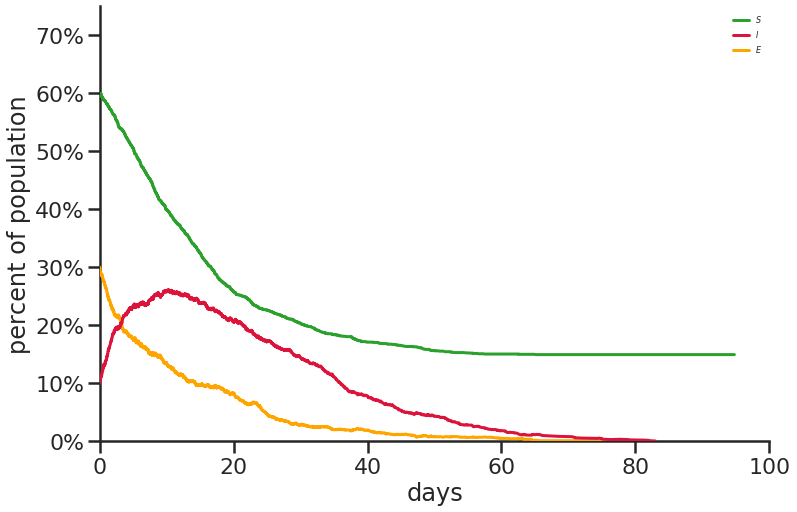

t = 0.00
t = 10.01
t = 20.00
t = 30.00
t = 40.06
t = 50.05
t = 60.17
t = 70.03
t = 90.04


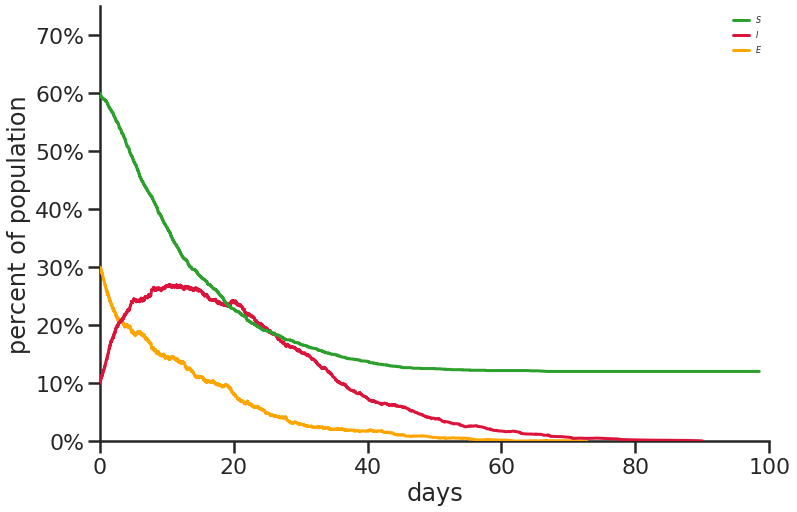

t = 0.00
t = 10.00
t = 20.00
t = 30.02
t = 40.01
t = 50.04
t = 60.01
t = 70.61
t = 80.12
t = 90.34
t = 140.73


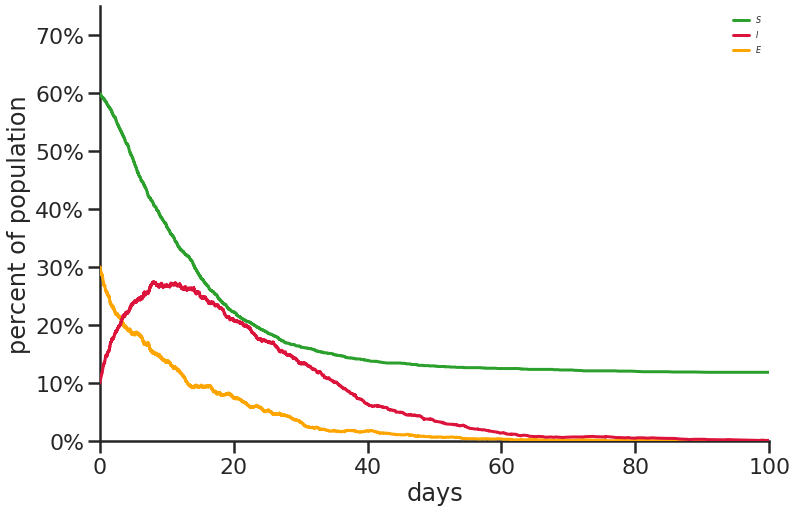

t = 0.01
t = 10.00
t = 20.00
t = 30.03
t = 40.04
t = 50.26
t = 60.74
t = 70.07
t = 100.03


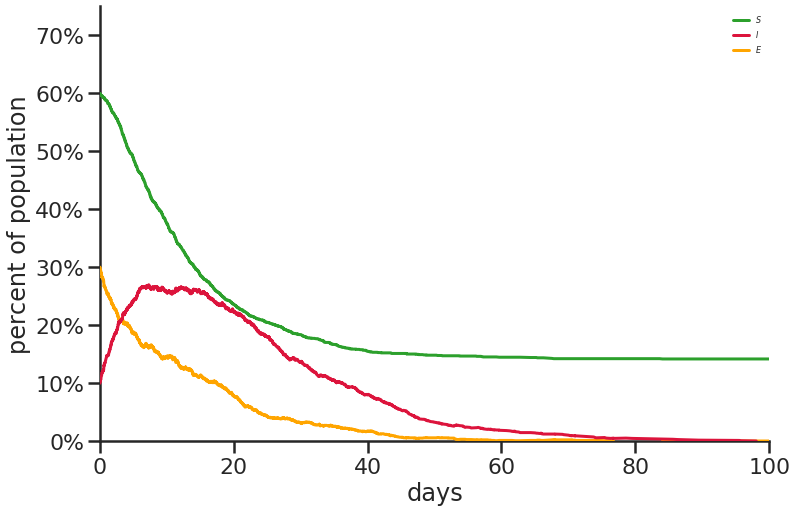

t = 0.00
t = 10.02
t = 20.00
t = 30.05
t = 40.00
t = 50.08
t = 60.01
t = 70.48


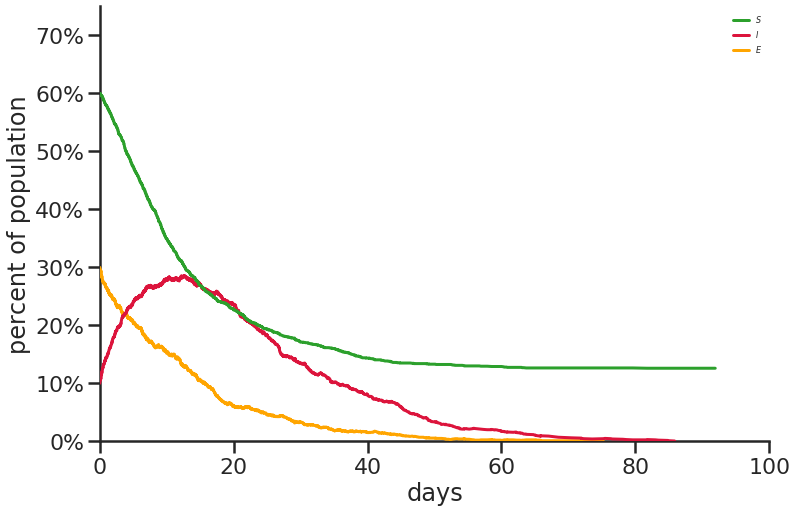

t = 0.00
t = 10.00
t = 20.01
t = 30.03
t = 40.05
t = 50.02
t = 60.19
t = 70.13
t = 80.05


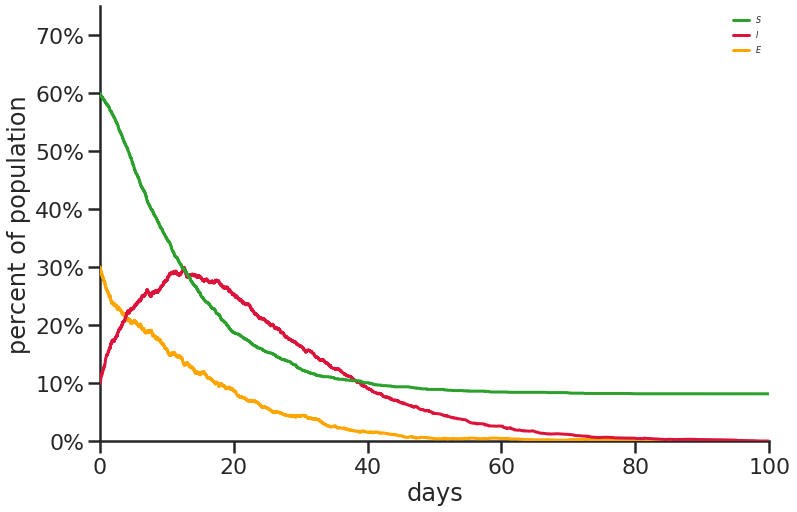

t = 0.00
t = 10.00
t = 20.00
t = 30.04
t = 40.01
t = 50.21
t = 60.17
t = 70.13
t = 80.74
t = 100.34
t = 110.58


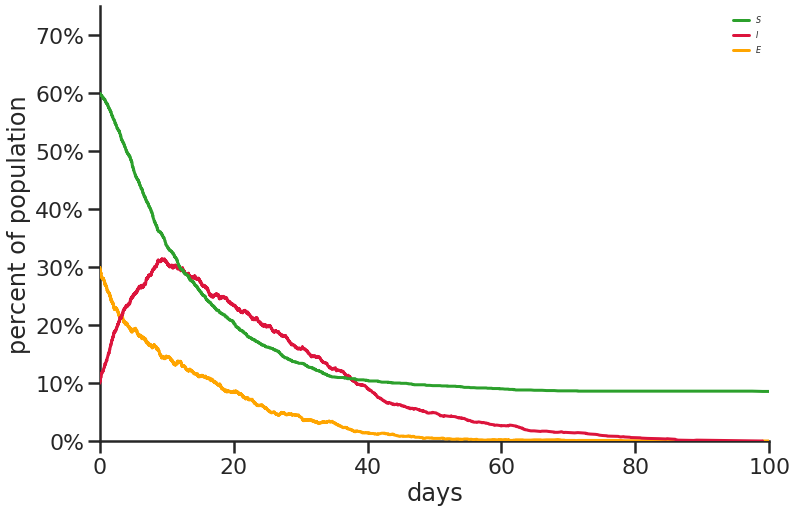

t = 0.00
t = 10.00
t = 20.00
t = 30.09
t = 40.02
t = 50.03
t = 60.11
t = 70.45
t = 80.08
t = 120.55


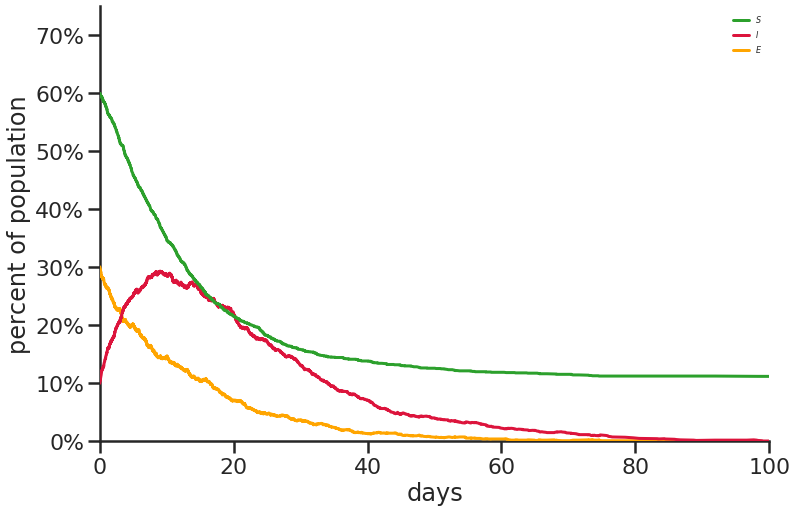

t = 0.01
t = 10.00
t = 20.00
t = 30.02
t = 40.01
t = 50.04
t = 60.10
t = 70.24
t = 80.71
t = 90.30


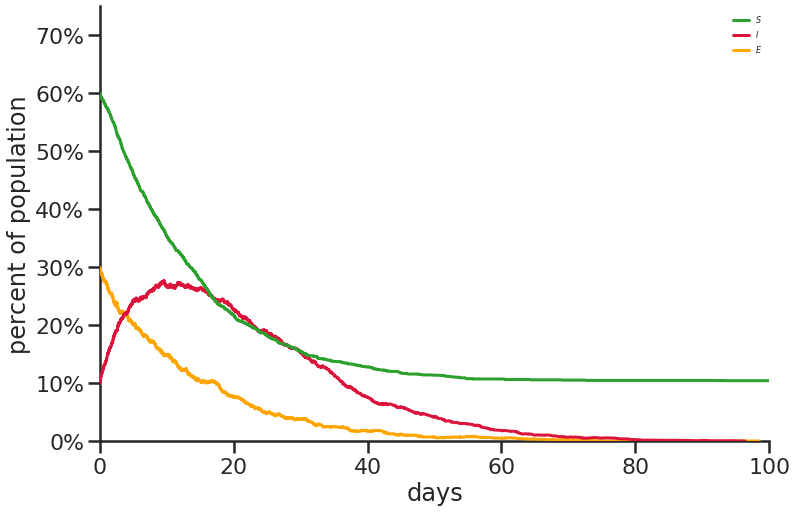

t = 0.02
t = 10.00
t = 20.01
t = 30.03
t = 40.09
t = 50.10
t = 60.67
t = 70.14
t = 80.03
t = 90.21
t = 100.60


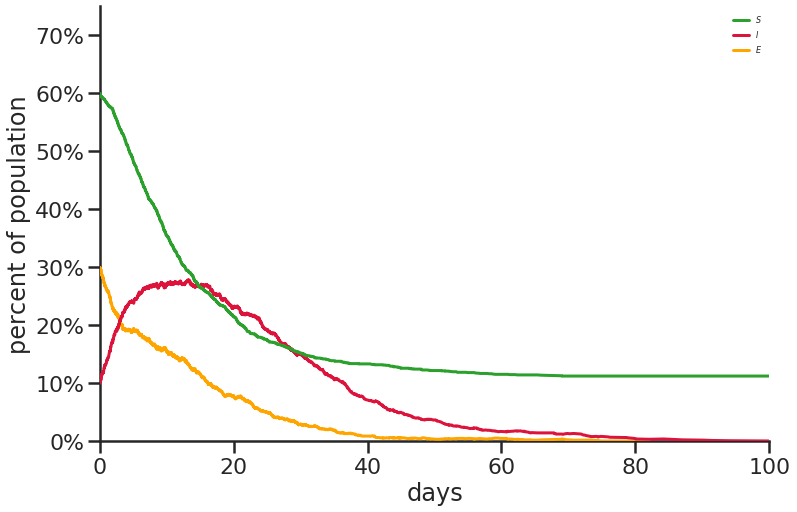

t = 0.01
t = 10.00
t = 20.01
t = 30.01
t = 40.17
t = 50.10
t = 60.16
t = 70.63
t = 90.11
t = 100.62


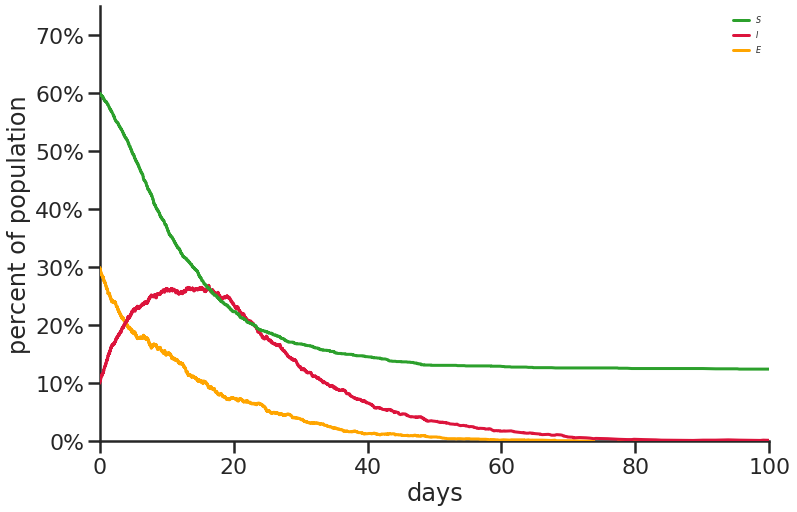

In [10]:
P0=[]
P1=[]
for graph in graph_list:
    p0,p1 = ipfnLine(graph,2000)
    P0.append(p0)
    P1.append(p1)
    

In [13]:
len(P0)

22

In [36]:
fig = go.Figure()

for i in range(len(P0)):
    fig.add_trace(go.Scatter(x=P0[i], y=P1[i],
                    mode='lines'))
    #ax.plot(P0[i],P1[i],color=plt.cm.viridis(i*10))
    
fig.show()

In [40]:
import plotly
plotly.offline.plot(fig)

'temp-plot.html'

In [22]:
with open('Cluster Experiments/Edge_tests.pkl', 'rb') as infile:
    op = pickle.load(infile)

In [14]:
with open('Cluster Experiments/Edge_tests.pkl', 'wb') as outfile:
    pickle.dump([Y,X,T,TP,NPL,AVG,STDV,COUNT], outfile, pickle.HIGHEST_PROTOCOL)

In [15]:
import pandas as pd

[0.224,
 0.2345,
 0.2275,
 0.2265,
 0.2365,
 0.2495,
 0.2505,
 0.2435,
 0.254,
 0.2625,
 0.2865,
 0.2615,
 0.275,
 0.2785,
 0.28,
 0.3025,
 0.2875,
 0.27,
 0.287,
 0.2835,
 0.286]

In [48]:
df = pd.DataFrame()
df['Y']= Y + op[0][2:]
df['X'] = X +op[1][2:]
df['T'] = T+op[2][2:]
df['Total'] = total
df['Cluster1_Inf'] = cluster1_inf
df['Clustr2_Inf'] = COUNT+op[7][2:]
df['Standard Deviation'] = STDV+op[6][2:]
#df['NPL']=NPL+op[4][1:]
df['rows'] = mycols


In [47]:
mycols = ['0','100','200','300','400','500','600','700','800','900','1k','1.5k','2k','2.5k','3k','3.5k','4','4.5k','5k','5.5k','6k','6.5k','7k','7.5k','8k','8.5k','9k','9.5k','10k','10.5k','11k']
#df= df.transpose()

In [37]:
df.columns = mycols

In [38]:
df = df.transpose()

In [49]:
df

,Y,X,T,Total,Cluster1_Inf,Clustr2_Inf,Standard Deviation,rows
0,0.2170,4.846378,0.4745,949.0,949.0,0,0.054319,0
1,0.2205,7.183964,0.4970,994.0,934.0,60,0.060242,100
2,0.2235,5.937872,0.5410,1082.0,934.0,148,0.069301,200
3,0.2240,6.470207,0.5915,1183.0,930.0,253,0.070713,300
4,0.2280,6.097366,0.5985,1197.0,938.0,259,0.071236,400
5,0.2215,5.946489,0.6500,1300.0,944.0,356,0.068548,500
6,0.2190,7.222292,0.6445,1289.0,939.0,350,0.065674,600
7,0.2085,5.674418,0.6555,1311.0,941.0,370,0.060056,700
8,0.2185,5.648869,0.6950,1390.0,952.0,438,0.064709,800
9,0.2240,9.928668,0.6645,1329.0,932.0,397,0.065370,900


In [145]:
df1 = df.iloc[:7,:]
df2= df.iloc[7:,:]


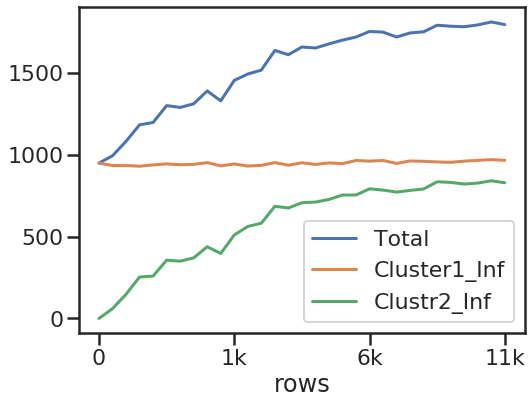

In [50]:
ax = plt.gca()

df.plot(kind='line',x='rows',y='Total',ax=ax)
df.plot(kind='line',x='rows',y='Cluster1_Inf',ax=ax)
df.plot(kind='line',x='rows',y='Clustr2_Inf',ax=ax)

plt.show()

(0, 0.35)

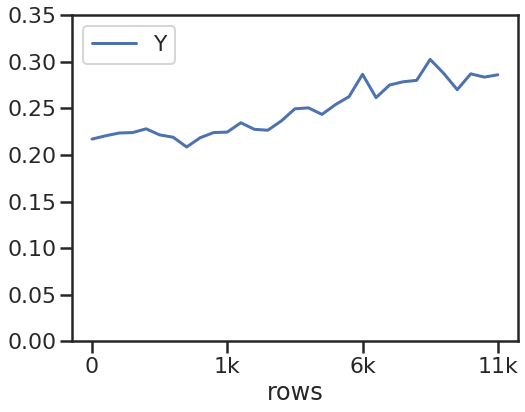

In [55]:
df.plot('rows','Y')
plt.ylim([0,0.35])

(0, 0.08)

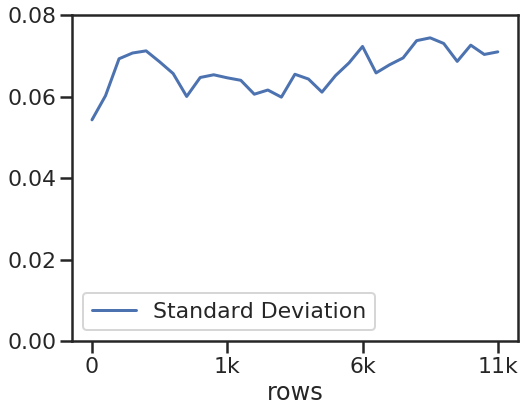

In [57]:
df.plot('rows','Standard Deviation')
plt.ylim([0,0.08])

(0, 15)

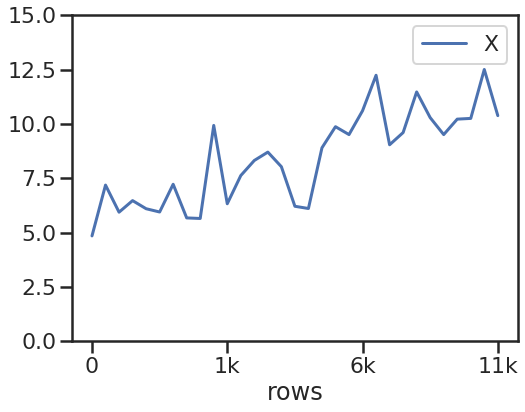

In [58]:
df.plot('rows','X')
plt.ylim([0,15])

In [44]:
total = np.asarray(T+op[2][2:] )
counts = np.asarray(COUNT+op[7][2:])
cluster1_inf = (total*2000)-counts
total = total*2000

t = 0.00
t = 10.00
t = 20.01
t = 30.11
t = 40.01
t = 50.02
t = 60.45
t = 70.08


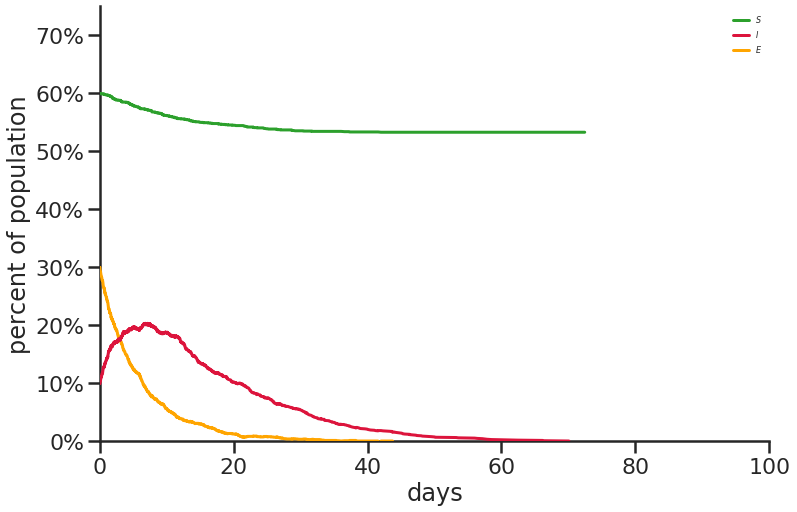

t = 0.01
t = 10.01
t = 20.03
t = 30.34
t = 40.09
t = 50.29
t = 60.31
t = 70.05
t = 90.38
t = 100.20


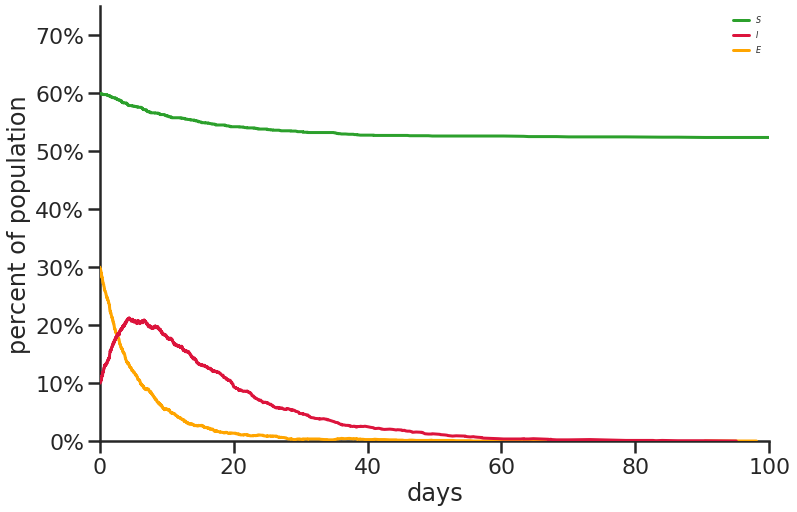

t = 0.02
t = 10.02
t = 20.01
t = 30.03
t = 40.26
t = 50.01
t = 60.68
t = 80.88
t = 90.72


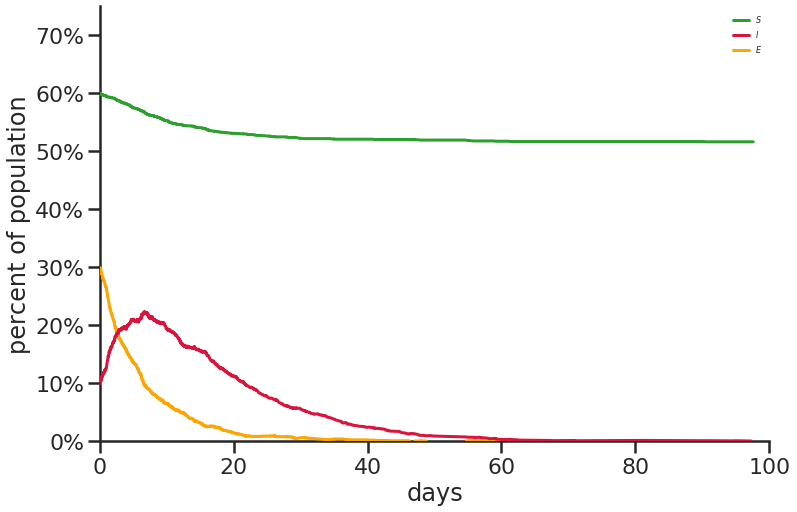

t = 0.01
t = 10.03
t = 20.00
t = 30.04
t = 40.04
t = 50.29
t = 60.66
t = 70.87
t = 80.57
t = 90.42
t = 100.66


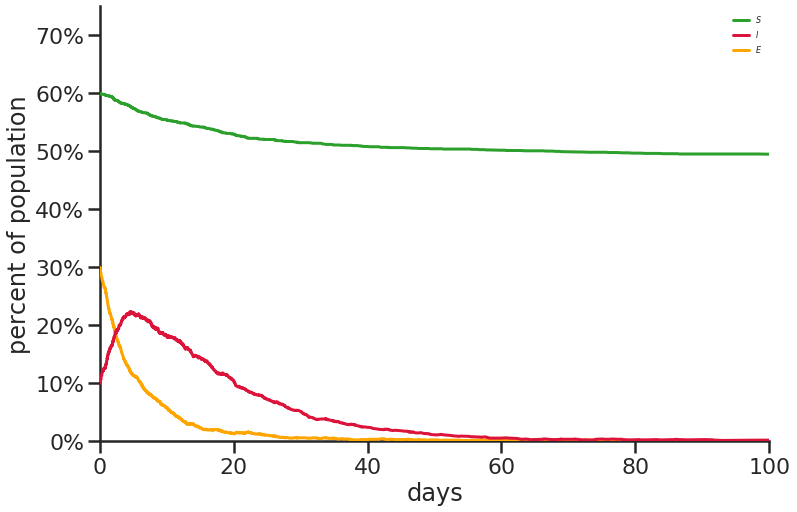

t = 0.04
t = 10.00
t = 20.03
t = 30.02
t = 40.01
t = 50.06
t = 60.14
t = 70.80
t = 80.44


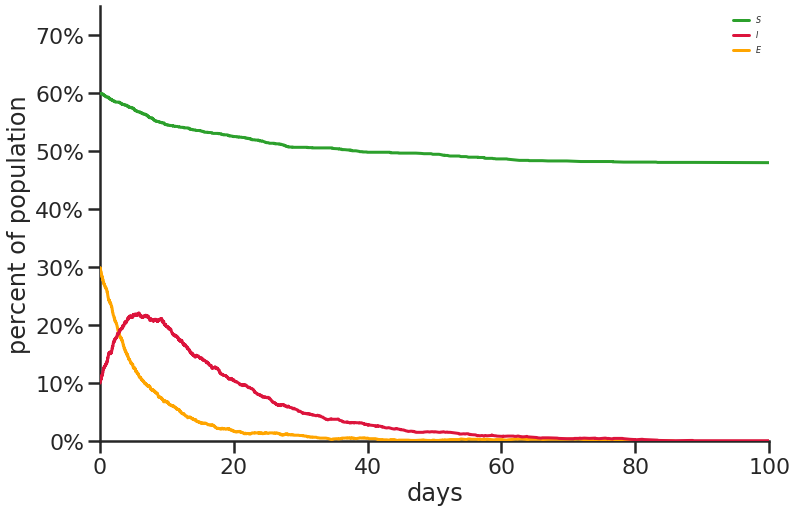

t = 0.01
t = 10.04
t = 20.04
t = 30.00
t = 40.09
t = 50.04
t = 60.02
t = 70.27
t = 80.61
t = 90.08
t = 120.23


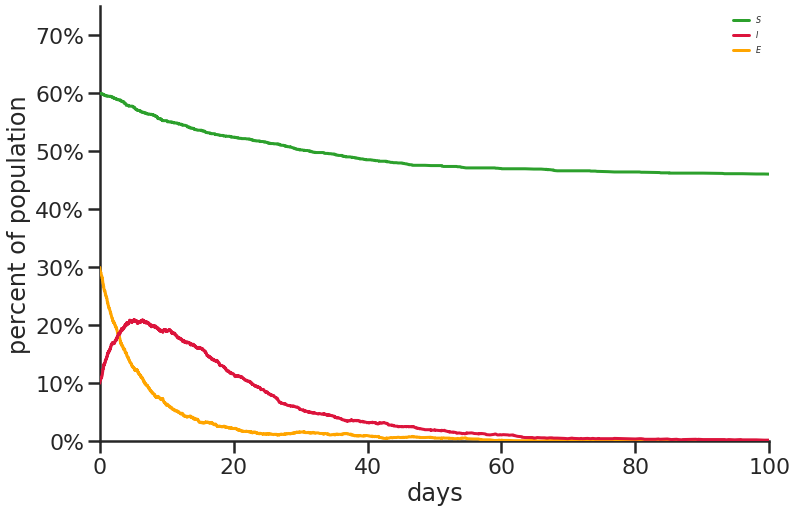

t = 0.01
t = 10.01
t = 20.02
t = 30.04
t = 40.03
t = 50.14
t = 60.20
t = 70.01
t = 80.11
t = 90.32
t = 100.19


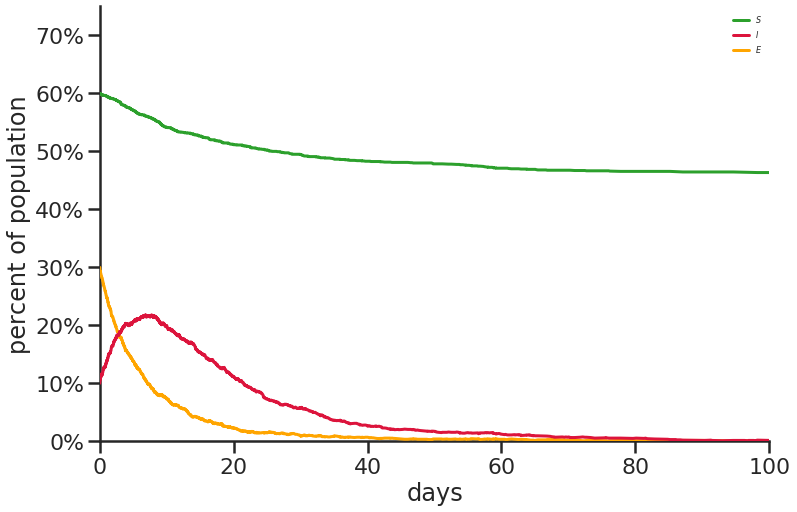

In [20]:
count_m=[]
for graph in graph_list:
    SIGMA  = 1/5.2
    GAMMA  = 1/10
    s=2000
    R0     = 2.5
    BETA   = 1/(1/GAMMA) * R0
    model_base = SEIRSNetworkModel(G       = graph, 
                          beta    = BETA, 
                          sigma   = SIGMA, 
                          gamma   = GAMMA, 
                          initE = s*0.30, initI = s*0.1)
    model_base.run(T=300)
    fig,axs = model_base.figure_basic(ylim=0.75,xlim=100)
    P = model_base.X
    cluster2 = P[1000:]
    count =0
    for i in cluster2:
        if(i==4):
            count = count+1
    count_m.append(count)

In [21]:
count_m

[0, 25, 18, 78, 100, 146, 133]

t = 0.01
t = 10.01
t = 20.00
t = 30.01
t = 40.00
t = 50.00
t = 60.25
t = 70.09
t = 80.16
t = 90.58
t = 110.48


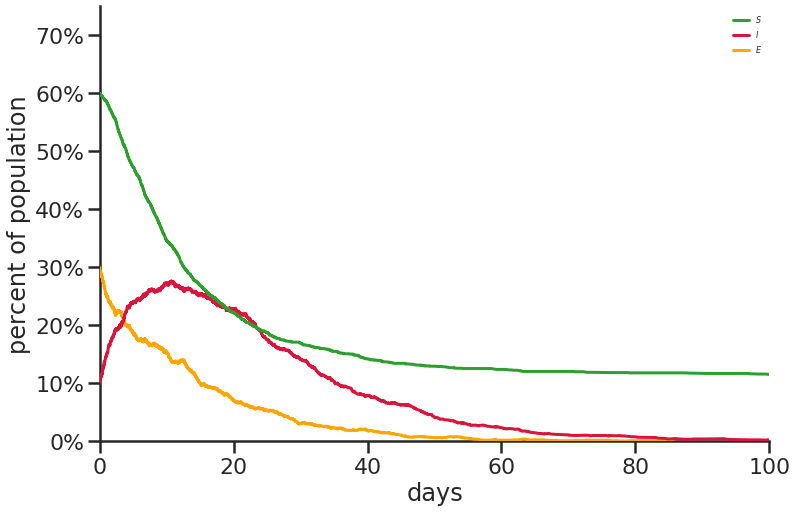

t = 0.00
t = 10.01
t = 20.00
t = 30.01
t = 40.03
t = 50.06
t = 60.18
t = 70.13
t = 80.41
t = 100.63
t = 140.58


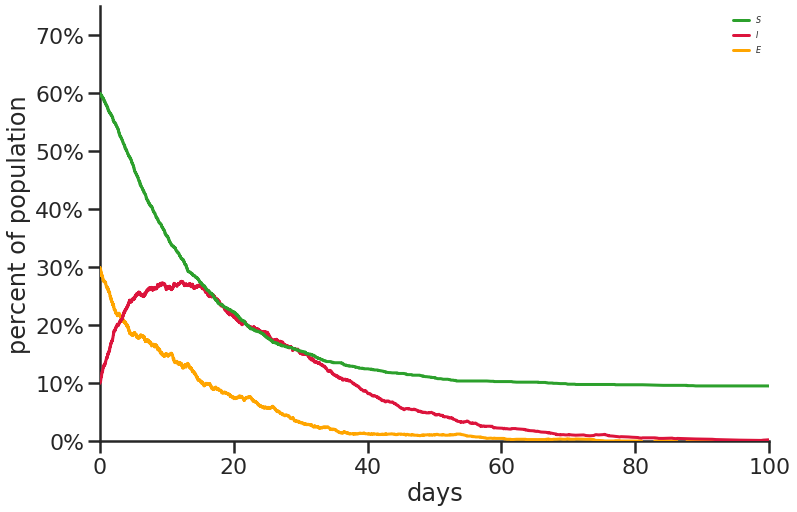

t = 0.02
t = 10.01
t = 20.00
t = 30.02
t = 40.00
t = 50.01
t = 60.01
t = 70.64
t = 80.27
t = 90.76


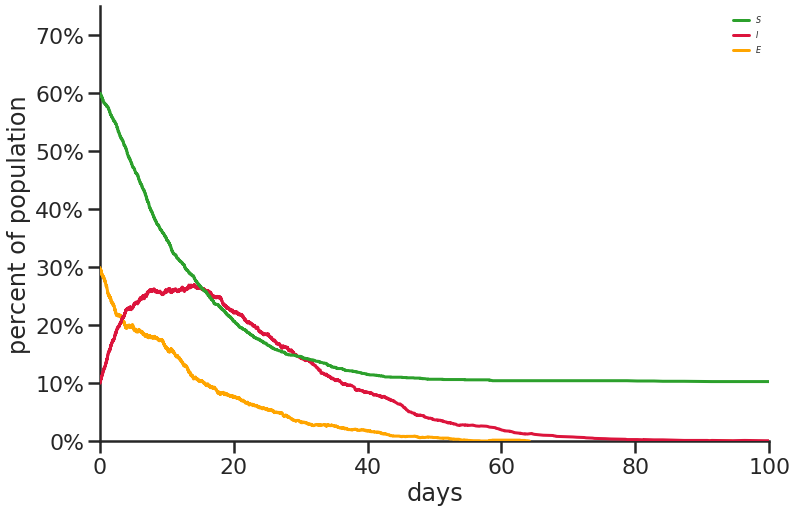

t = 0.00
t = 10.00
t = 20.00
t = 30.02
t = 40.00
t = 50.12
t = 60.04
t = 80.41
t = 90.48


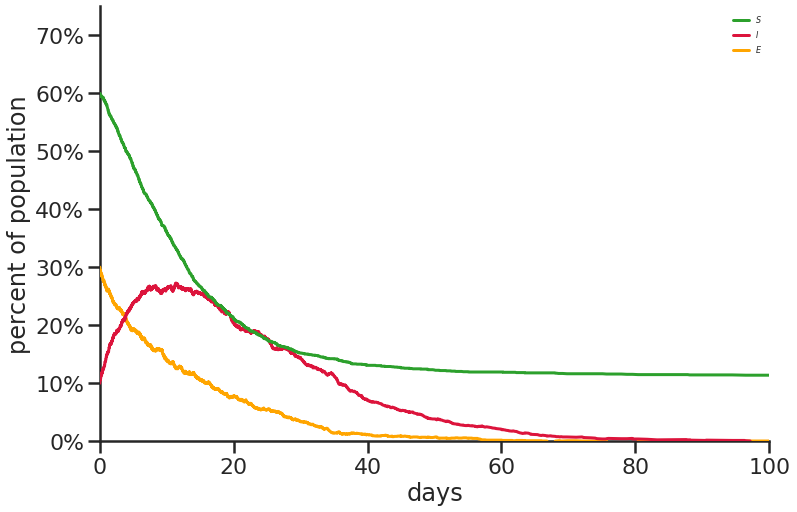

t = 0.01
t = 10.00
t = 20.01
t = 30.00
t = 40.02
t = 50.06
t = 60.10
t = 80.88
t = 90.53


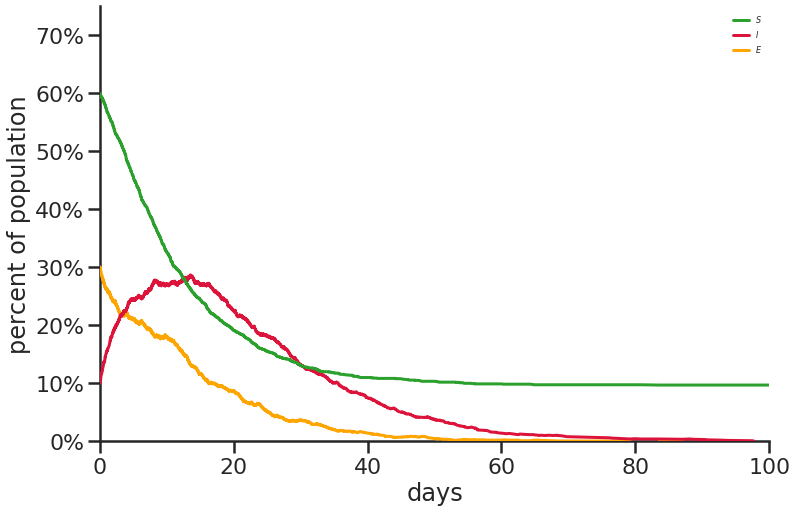

t = 0.00
t = 10.01
t = 20.00
t = 30.01
t = 40.08
t = 50.03
t = 60.07
t = 70.07


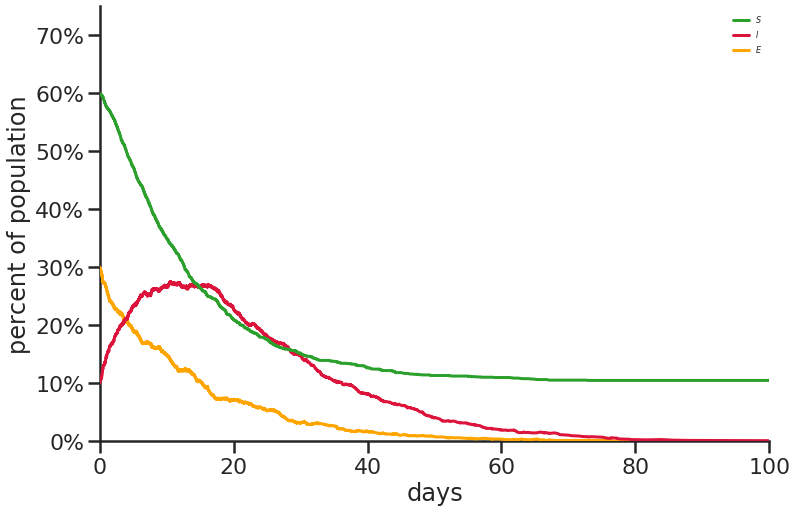

t = 0.01
t = 10.01
t = 20.01
t = 30.01
t = 40.03
t = 50.00
t = 60.03
t = 70.77


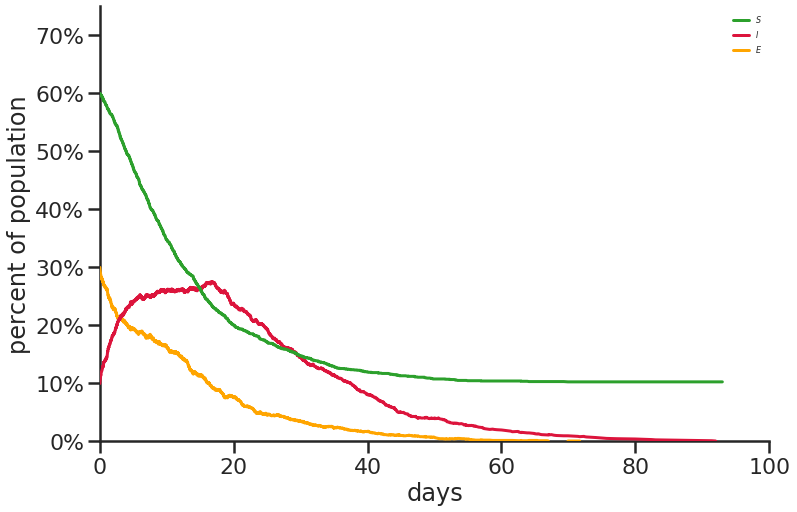

t = 0.01
t = 10.00
t = 20.00
t = 30.00
t = 40.02
t = 50.09
t = 60.08
t = 100.25


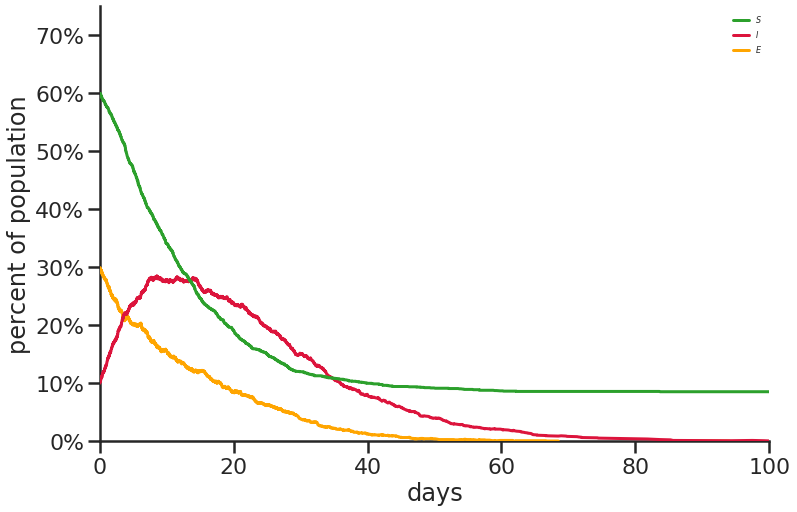

In [37]:
count_mp=[]
for graph in graph_list:
    SIGMA  = 1/5.2
    GAMMA  = 1/10
    s=2000
    R0     = 2.5
    BETA   = 1/(1/GAMMA) * R0
    model_base = SEIRSNetworkModel(G       = graph_temp, 
                          beta    = BETA, 
                          sigma   = SIGMA, 
                          gamma   = GAMMA, 
                          initE = s*0.30, initI = s*0.1)
    model_base.run(T=300)
    fig,axs = model_base.figure_basic(ylim=0.75,xlim=100)
    P = model_base.X
    cluster2 = P[1000:]
    count =0
    for i in cluster2:
        if(i==4):
            count = count+1
    count_mp.append(count)

In [39]:
SIGMA  = 1/5.2
GAMMA  = 1/10
s=2000
R0     = 2.5
BETA   = 1/(1/GAMMA) * R0
model_base = SEIRSNetworkModel(G       = graph_temp, 
                          beta    = BETA, 
                          sigma   = SIGMA, 
                          gamma   = GAMMA, 
                          initE = s*0.30, initI = s*0.1)

t = 0.00
t = 10.00
t = 20.05
t = 30.00
t = 40.04
t = 50.13
t = 60.08
t = 70.51
t = 80.13
t = 110.77


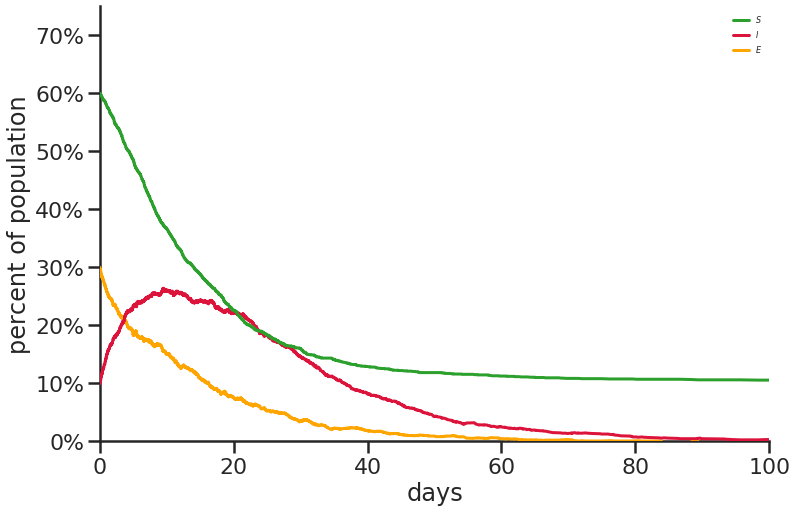

In [42]:
model_base.run(T=300)
fig,axs = model_base.figure_basic(ylim=0.75,xlim=100)

line = axs.lines[1]
p = line.get_data()
p0 = p[0].compressed()
p1 = p[1].compressed()
#Maximum
m = max(p[1])
#Days Max
ind= numpy.argmax(p[1])
d = p[0][numpy.argmax(p[1])]
#Mean and St Deviation
mean  = statistics.mean(p1)
stdev =  statistics.stdev(p1)
line1 = axs.lines[2]
w = line1.get_data()
#Total Infections
tot = 1 -(w[1][w[1].shape[0]-1])
tp = 0.1*m
np = 0.9*m
#Ten Percent
tpl =[]
for i in range(len(p1)):
    x = numpy.abs(p1[i]-tp)
    if(x<0.001):
        #print(p1[i],x,p0[i])
        tpl.append(p0[i])
tplval = statistics.mean(tpl)

#Ninety Percent
nplfh =[]
nplsh = []
for i in range(ind):
    x = numpy.abs(p1[i]-np)
    if(x<0.001):
        #print(p1[i],x,p0[i])
        nplfh.append(p0[i])
for i in range(ind, len(p1)):
    x = numpy.abs(p1[i]-np)
    if(x<0.001):
        #print(p1[i],x,p0[i])
        nplsh.append(p0[i])
npl=[(statistics.mean(nplfh)),(statistics.mean(nplsh))]

In [43]:
print(m,d,tot,tplval,npl, mean, stdev
     )

0.264 9.488367055815466 0.8945 58.668627849796586 [5.829179119177542, 16.441780500129415] 0.19422670025188918 0.06515918712771042


In [44]:
P = model_base.X

In [45]:
cluster2 = P[1000:]
count =0
for i in cluster2:
    if(i==4):
        count = count+1
        
    

In [46]:
count

827

In [20]:
graph1.number_of_edges()

11215